In [1]:
import torch
import matplotlib.pyplot as plt

from geocalib import viz2d, GeoCalib
from geocalib.camera import camera_models
from geocalib.gravity import Gravity
from geocalib.utils import deg2rad, print_calibration

In [2]:
img_path = "assets/pinhole-church.jpg"

# Simple Inference

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# initialize model with weights in {"pinhole", "distorted"}
model = GeoCalib(weights="pinhole").to(device)

# load image as tensor in range [0, 1] and in format [C, H, W]
img = model.load_image(img_path).to(device)
results = model.calibrate(img)

print_calibration(results)


Estimated parameters (Pred):
Roll:  0.3° (± 1.9)°
Pitch: 38.4° (± 1.9)°
vFoV:  85.8° (± 2.6)°
Focal: 551.4 px (± 18.0 px)


# Visualize

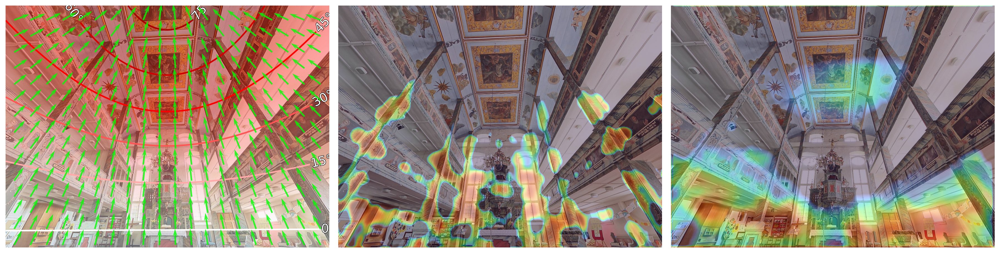

In [4]:
# show images
fig = viz2d.plot_images([img.permute(1, 2, 0).cpu().numpy()] * 3)
ax = fig.get_axes()
viz2d.plot_perspective_fields([results["camera"][0]], [results["gravity"][0]], axes=[ax[0]])
viz2d.plot_confidences([results[f"{k}_confidence"][0] for k in ["up", "latitude"]], axes=ax[1:])
plt.show()

# Add Priors

In [5]:
# infer camera parameters with prior focal length
img = model.load_image(img_path).to(device)
results = model.calibrate(img, priors={"focal": torch.tensor(556.6).to(device)})

print_calibration(results)


Estimated parameters (Pred):
Roll:  0.4° (± 1.8)°
Pitch: 38.5° (± 1.8)°
vFoV:  85.2° (± 0.0)°
Focal: 556.6 px (± 0.0 px)


In [6]:
prior_gravity = Gravity.from_rp(deg2rad(0.35), deg2rad(38.2)).vec3d  # 3D tensor or Gravity object

# infer camera parameters with gravity prior
img = model.load_image(img_path).to(device)
results = model.calibrate(img, priors={"gravity": prior_gravity.to(device)})

print_calibration(results)


Estimated parameters (Pred):
Roll:  0.3° (± 0.0)°
Pitch: 38.2° (± 0.0)°
vFoV:  85.9° (± 2.5)°
Focal: 549.6 px (± 17.2 px)


# Other Camera Models

In [7]:
print(f"Available camera models: {list(camera_models.keys())}")
camera_model = "simple_divisional"

# initialize model with weights in {"pinhole", "distorted"}
weights = "pinhole" if camera_model == "pinhole" else "distorted"
model = GeoCalib(weights=weights).to(device)

# load and calibrate distorted image
img = model.load_image("assets/fisheye-skyline.jpg").to(device)
results = model.calibrate(img, camera_model=camera_model)

print_calibration(results)

Available camera models: ['pinhole', 'simple_radial', 'simple_divisional']

Estimated parameters (Pred):
Roll:  -1.0° (± 1.8)°
Pitch: 18.3° (± 4.8)°
vFoV:  78.4° (± 7.8)°
Focal: 817.0 px (± 80.5 px)
K1:    -0.4


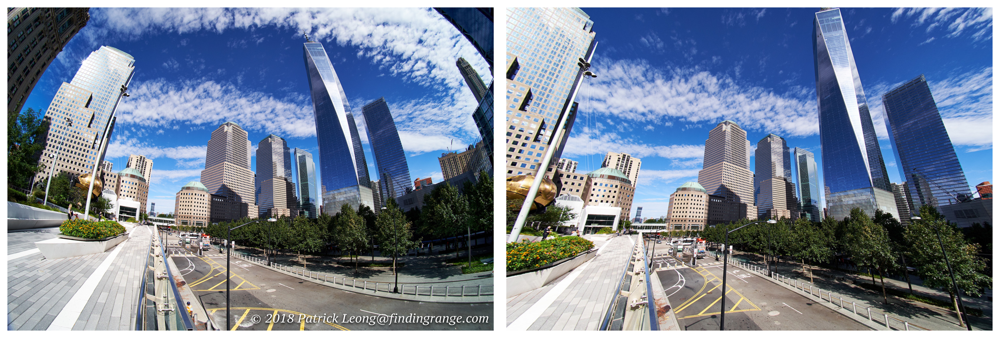

In [8]:
# images can be undistorted using the predicted camera
img_undistorted = results["camera"].undistort_image(img[None])[0]
fig = viz2d.plot_images([im.permute(1, 2, 0).cpu().numpy() for im in [img, img_undistorted]])
plt.show()